<a href="https://colab.research.google.com/github/Cemputus/-100daysofcode2023/blob/main/image_classification_vit_base_and_advanced.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning for Bean Leaf Disease Detection Using Vision Transformers

## Project Overview
This project implements a deep learning solution for automated bean leaf disease detection. We will build and compare two Vision Transformer (ViT) models to classify bean leaves into three categories:
- **Healthy**: Normal, healthy bean leaves
- **Angular Leaf Spot**: Leaves with irregular brown patches
- **Bean Rust**: Leaves with circular brown spots surrounded by white-ish yellow rings

## Objectives
1. Load and analyze the beans dataset from Hugging Face
2. Build a baseline ViT model trained from scratch
3. Build an advanced ViT model using transfer learning
4. Compare both models using standard evaluation metrics
5. Create a Gradio demo application for real-world use

## Justification
Beans are an essential crop in Uganda, providing food security and economic stability. Early detection of diseases like Angular Leaf Spot and Bean Rust can help farmers take timely action to save their crops. Automated detection using deep learning can make expert-level diagnosis accessible to farmers in remote areas.


### SDG
- SDG 2 `Zero Hunger`: Increasing crop yeilds through early disease detection
- SDG 1 `No Poverty`: Beans are key income crop for Smallholder farmer
- SDG 9 `Industry, Innnovation & Infrastructure`: the use ofv Computer Vision Mpdels(ViT) is a direct example of Digital agriculture and Innovation driven development
- SDG 12 `Responsible Consumption`: Reduce unnecessary pesticide use
- SDG 13 `Climate Action`: Climate variability increases crop disease
---

In [ ]:
# Install required packages
import subprocess
import sys

def install_package(package):
    """Install a package if not already installed"""
    try:
        __import__(package.split('==')[0].replace('-', '_'))
    except ImportError:
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

# Install required packages
packages = [
    "datasets",
    "transformers",
    "torch",
    "torchvision",
    "pillow",
    "matplotlib",
    "seaborn",
    "scikit-learn",
    "evaluate",
    "gradio",
    "accelerate"
]

print("Checking and installing required packages...")
for pkg in packages:
    try:
        install_package(pkg)
    except:
        pass  # Continue if package install fails

print("✅ Package installation check complete!")

Checking and installing required packages...
✅ Package installation check complete!


# 1. Introduction

## 1.1 Problem Statement
Bean crops in Uganda face significant threats from diseases such as Angular Leaf Spot and Bean Rust, which can severely impact crop yields and food security. Manual inspection by agricultural experts is time-consuming, expensive, and not always available in remote farming areas.

## 1.2 Solution Approach
We will develop automated disease detection using Vision Transformers (ViT), a state-of-the-art deep learning architecture that treats images as sequences of patches, similar to how transformers process text.

---

# 2. Data Collection

## 2.1 Dataset Source
We use the **Beans** dataset from Hugging Face, collected by the Makerere AI Lab and NaCRRI (National Crops Resources Research Institute). This dataset contains labeled images of bean leaves with three classes.

**Dataset Link**: https://huggingface.co/datasets/beans

## 2.2 Loading the Dataset
Let's load the dataset using Hugging Face's `datasets` library.



In [ ]:
from datasets import load_dataset
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


# Load the beans dataset from Hugging Face
print("Loading beans dataset from Hugging Face...")
ds = load_dataset('beans')
print("\nDataset loaded successfully!")
print(f"Dataset splits: {list(ds.keys())}")
ds

Loading beans dataset from Hugging Face...

Dataset loaded successfully!
Dataset splits: ['train', 'validation', 'test']


DatasetDict({
    train: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 1034
    })
    validation: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 133
    })
    test: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 128
    })
})

## 2.3 Dataset Structure
Let's examine the structure of the dataset and understand its features.

In [ ]:
# Examine dataset features
print("Dataset features:")
print(ds['train'].features)
print("\nClass labels:")
labels = ds['train'].features['labels']
print(f"Number of classes: {labels.num_classes}")
print(f"Class names: {labels.names}")

# Get dataset statistics
print("\nDataset Statistics:")
for split in ['train', 'validation', 'test']:
    print(f"{split.capitalize()}: {len(ds[split])} images")

Dataset features:
{'image_file_path': Value('string'), 'image': Image(mode=None, decode=True), 'labels': ClassLabel(names=['angular_leaf_spot', 'bean_rust', 'healthy'])}

Class labels:
Number of classes: 3
Class names: ['angular_leaf_spot', 'bean_rust', 'healthy']

Dataset Statistics:
Train: 1034 images
Validation: 133 images
Test: 128 images


## 2.4 Sample Images
Let's look at some example images from each class to understand what we're working with.

Filter:   0%|          | 0/1034 [00:00<?, ? examples/s]

Filter:   0%|          | 0/1034 [00:00<?, ? examples/s]

Filter:   0%|          | 0/1034 [00:00<?, ? examples/s]

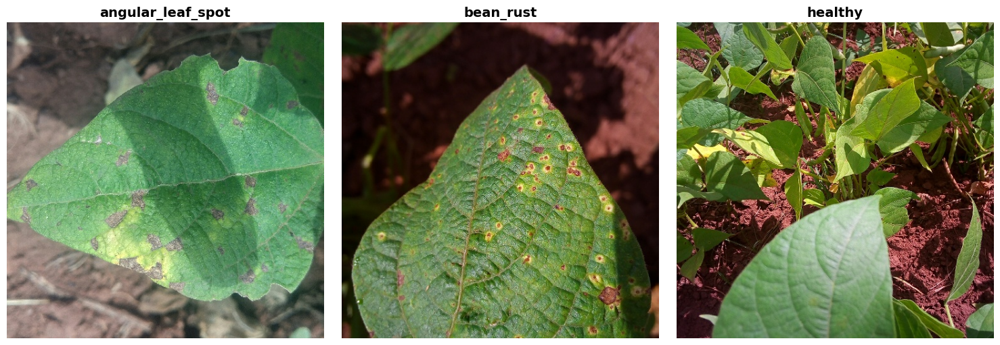

In [ ]:
# Display sample images from each class
import matplotlib.pyplot as plt
import random

# Set random seed for reproducibility
random.seed(42)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
class_names = labels.names

for idx, class_name in enumerate(class_names):
    # Get a random sample from this class
    class_samples = ds['train'].filter(lambda x: x['labels'] == idx)
    if len(class_samples) > 0:
        sample_idx = random.randint(0, len(class_samples) - 1)
        sample = class_samples[sample_idx]
        axes[idx].imshow(sample['image'])
        axes[idx].set_title(f'{class_name}', fontsize=14, fontweight='bold')
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

Example 1 - Label: angular_leaf_spot


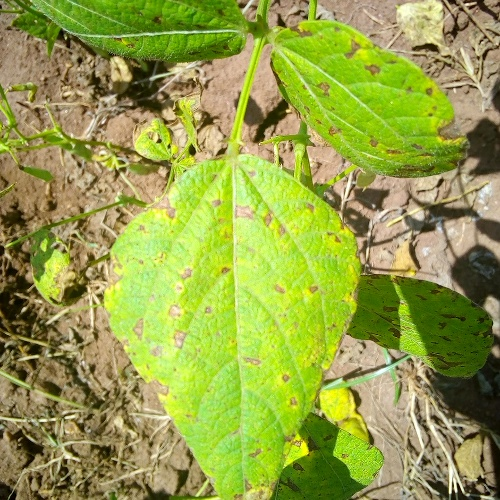

In [ ]:
# Show another example
ex1 = ds['train'][20]
print(f"Example 1 - Label: {labels.int2str(ex1['labels'])}")
ex1['image']

Example 2 - Label: angular_leaf_spot


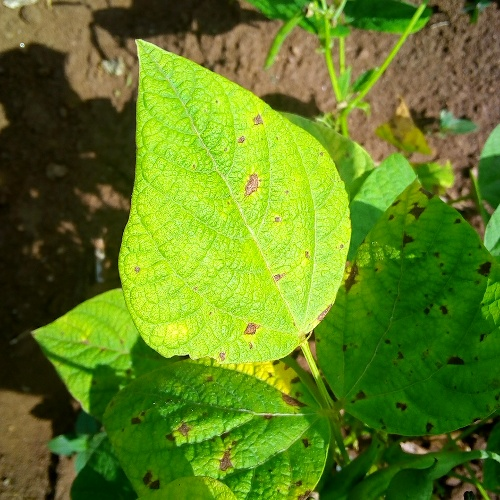

In [ ]:
# Show another example
ex2 = ds['train'][100]
print(f"Example 2 - Label: {labels.int2str(ex2['labels'])}")
ex2['image']

---

# 3. Data Preprocessing

## 3.1 Understanding Data Format
Each example in the dataset has:
- `image`: A PIL Image object
- `image_file_path`: Path to the image file
- `labels`: Integer label (0, 1, or 2) representing the class

## 3.2 Loading ViT Image Processor
Vision Transformers require specific image preprocessing. We'll use the ViT image processor to handle resizing, normalization, and tensor conversion.

In [ ]:
from transformers import ViTImageProcessor

# Load image processor for ViT models
# Using google/vit-base-patch16-224-in21k for advanced model
model_name_advanced = 'google/vit-base-patch16-224-in21k'
image_processor_advanced = ViTImageProcessor.from_pretrained(model_name_advanced)

# For baseline model, we'll use a smaller ViT configuration
model_name_baseline = 'google/vit-base-patch16-224'
image_processor_baseline = ViTImageProcessor.from_pretrained(model_name_baseline)

print("Image processors loaded successfully!")
print(f"\nAdvanced model processor: {model_name_advanced}")
print(f"Baseline model processor: {model_name_baseline}")

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

Image processors loaded successfully!

Advanced model processor: google/vit-base-patch16-224-in21k
Baseline model processor: google/vit-base-patch16-224


## 3.3 Image Preprocessing Function
We'll create a transform function to preprocess images for both models.

In [ ]:
# Test the image processor
test_image = ds['train'][0]['image']
processed = image_processor_advanced(test_image, return_tensors='pt')
print(f"Original image size: {test_image.size}")
print(f"Processed pixel values shape: {processed['pixel_values'].shape}")
print(f"Processed pixel values range: [{processed['pixel_values'].min():.3f}, {processed['pixel_values'].max():.3f}]")

Original image size: (500, 500)
Processed pixel values shape: torch.Size([1, 3, 224, 224])
Processed pixel values range: [-1.000, 1.000]


## 3.4 Data Transformation Pipeline
We'll create transform functions for both models that will be applied on-the-fly during training.

In [ ]:
# Transform function for advanced model
def transform_advanced(example_batch):
    """Preprocess images for advanced ViT model"""
    inputs = image_processor_advanced([x for x in example_batch['image']], return_tensors='pt')
    inputs['labels'] = example_batch['labels']
    return inputs

# Transform function for baseline model
def transform_baseline(example_batch):
    """Preprocess images for baseline ViT model"""
    inputs = image_processor_baseline([x for x in example_batch['image']], return_tensors='pt')
    inputs['labels'] = example_batch['labels']
    return inputs

# Apply transforms to datasets
ds_advanced = ds.with_transform(transform_advanced)
ds_baseline = ds.with_transform(transform_baseline)

print("Data transformation pipelines created!")
print(f"Sample transformed data shape: {ds_advanced['train'][0]['pixel_values'].shape}")

Data transformation pipelines created!
Sample transformed data shape: torch.Size([3, 224, 224])


In [ ]:
# Data Augmentation using torchvision transforms
from torchvision import transforms

# Augmentation transforms for training data
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=30),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
])

# No augmentation for validation/test sets
val_test_transform = transforms.Compose([])

print("✅ Data augmentation pipeline created!")
print("   Augmentations: Random flips, rotations, color jitter, affine transforms")
print("   Applied to: Training set only")


✅ Data augmentation pipeline created!
   Augmentations: Random flips, rotations, color jitter, affine transforms
   Applied to: Training set only


---

# 4. Exploratory Data Analysis (EDA)

## 4.1 Class Distribution Analysis
Let's analyze the distribution of classes across train, validation, and test sets.

### 3.5.1 Visualizing Augmented Images

Let's see how data augmentation transforms our images:


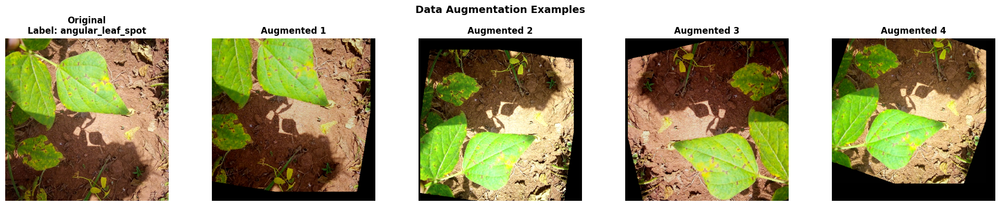

✅ Data augmentation visualization complete!
   Augmentations help model learn robust features from varied image conditions


In [ ]:
# Visualize augmented images
import torch
from PIL import Image

# Get a sample image
sample_image = ds['train'][0]['image']
sample_label = labels.int2str(ds['train'][0]['labels'])

# Create augmented versions
augmented_images = []
for i in range(4):
    aug_img = train_augmentation(sample_image)
    augmented_images.append(aug_img)

# Display original and augmented images
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
axes[0].imshow(sample_image)
axes[0].set_title(f'Original\nLabel: {sample_label}', fontweight='bold')
axes[0].axis('off')

for i, aug_img in enumerate(augmented_images):
    axes[i+1].imshow(aug_img)
    axes[i+1].set_title(f'Augmented {i+1}', fontweight='bold')
    axes[i+1].axis('off')

plt.suptitle('Data Augmentation Examples', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("✅ Data augmentation visualization complete!")
print("   Augmentations help model learn robust features from varied image conditions")


In [ ]:
# Analyze class distribution
import numpy as np

def get_class_distribution(dataset, split_name):
    """Get class distribution for a dataset split"""
    class_counts = {name: 0 for name in labels.names}
    for example in dataset[split_name]:
        class_name = labels.int2str(example['labels'])
        class_counts[class_name] += 1
    return class_counts

# Get distributions
train_dist = get_class_distribution(ds, 'train')
val_dist = get_class_distribution(ds, 'validation')
test_dist = get_class_distribution(ds, 'test')

# Create a summary DataFrame
summary_data = {
    'Class': labels.names,
    'Train': [train_dist[name] for name in labels.names],
    'Validation': [val_dist[name] for name in labels.names],
    'Test': [test_dist[name] for name in labels.names]
}
df_summary = pd.DataFrame(summary_data)
df_summary['Total'] = df_summary['Train'] + df_summary['Validation'] + df_summary['Test']

print("Class Distribution Summary:")
print("=" * 60)
print(df_summary.to_string(index=False))
print("=" * 60)

Class Distribution Summary:
            Class  Train  Validation  Test  Total
angular_leaf_spot    345          44    43    432
        bean_rust    348          45    43    436
          healthy    341          44    42    427


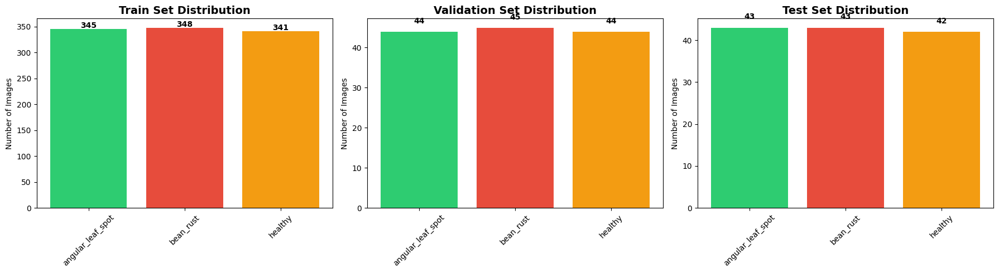

In [ ]:
# Visualize class distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

splits = ['train', 'validation', 'test']
for idx, split in enumerate(splits):
    dist = get_class_distribution(ds, split)
    axes[idx].bar(dist.keys(), dist.values(), color=['#2ecc71', '#e74c3c', '#f39c12'])
    axes[idx].set_title(f'{split.capitalize()} Set Distribution', fontsize=14, fontweight='bold')
    axes[idx].set_ylabel('Number of Images')
    axes[idx].tick_params(axis='x', rotation=45)
    for i, (k, v) in enumerate(dist.items()):
        axes[idx].text(i, v + 2, str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

## 4.2 Visualizing Examples from Each Class
Let's create a grid showing multiple examples from each disease class to better understand the visual characteristics.

Filter:   0%|          | 0/1034 [00:00<?, ? examples/s]

Filter:   0%|          | 0/1034 [00:00<?, ? examples/s]

Filter:   0%|          | 0/1034 [00:00<?, ? examples/s]

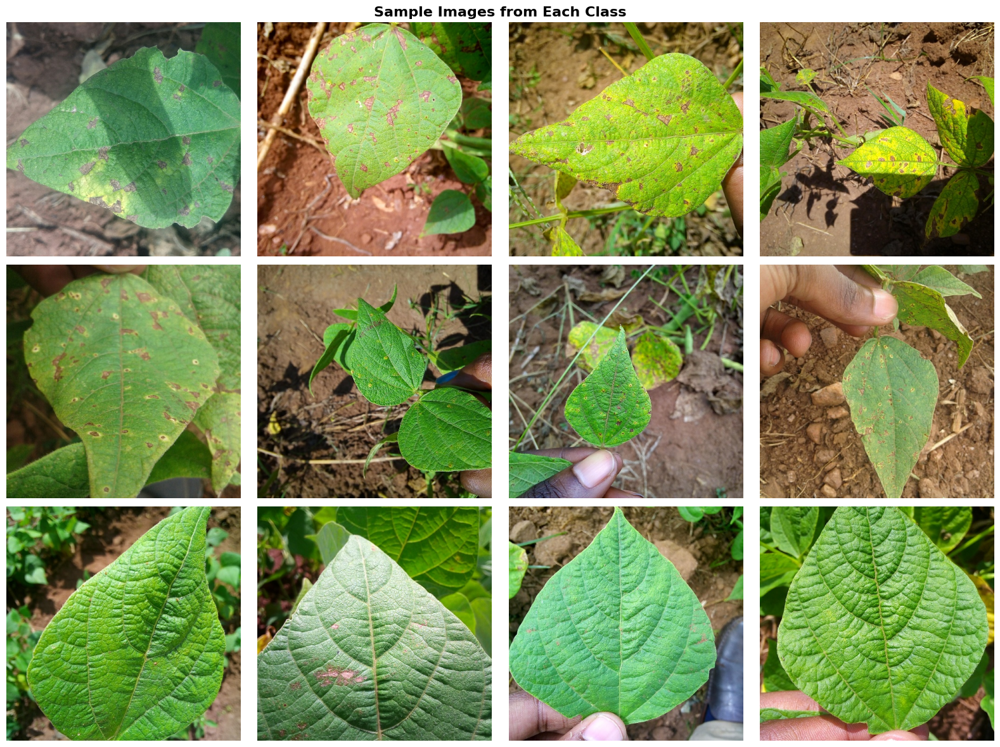


Visual Characteristics:
- Angular Leaf Spot: Has irregular brown patches
- Bean Rust: Has circular brown spots surrounded with a white-ish yellow ring
- Healthy: Looks healthy with uniform green color


In [ ]:
# Display grid of examples from each class
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle('Sample Images from Each Class', fontsize=16, fontweight='bold')

examples_per_class = 4
random.seed(42)  # Set seed for reproducibility

for class_id, class_name in enumerate(labels.names):
    # Get random samples from this class
    class_samples = ds['train'].filter(lambda x: x['labels'] == class_id)
    num_samples = min(examples_per_class, len(class_samples))
    if num_samples > 0:
        sample_indices = random.sample(range(len(class_samples)), num_samples)

        for col, idx in enumerate(sample_indices):
            sample = class_samples[idx]
            axes[class_id, col].imshow(sample['image'])
            if col == 0:
                axes[class_id, col].set_ylabel(class_name, fontsize=12, fontweight='bold', rotation=0, labelpad=40)
            axes[class_id, col].axis('off')

plt.tight_layout()
plt.show()

print("\nVisual Characteristics:")
print("- Angular Leaf Spot: Has irregular brown patches")
print("- Bean Rust: Has circular brown spots surrounded with a white-ish yellow ring")
print("- Healthy: Looks healthy with uniform green color")

## 4.3 Image Statistics Analysis

Let's analyze image dimensions, color distributions, and other statistical properties of the dataset.


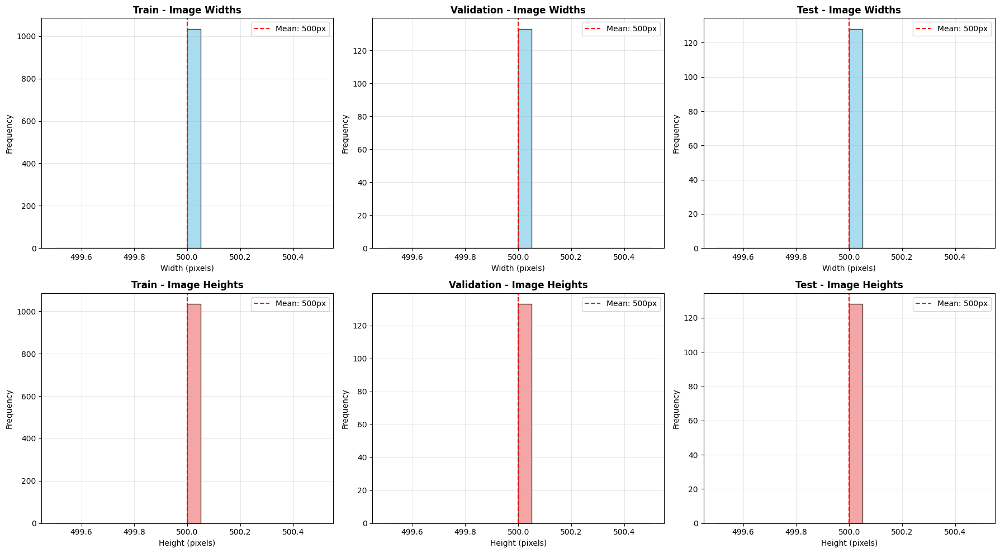


IMAGE DIMENSION STATISTICS

TRAIN:
  Width:  Mean=500.0, Std=0.0, Min=500, Max=500
  Height: Mean=500.0, Std=0.0, Min=500, Max=500

VALIDATION:
  Width:  Mean=500.0, Std=0.0, Min=500, Max=500
  Height: Mean=500.0, Std=0.0, Min=500, Max=500

TEST:
  Width:  Mean=500.0, Std=0.0, Min=500, Max=500
  Height: Mean=500.0, Std=0.0, Min=500, Max=500


In [ ]:
# Analyze image statistics
import numpy as np
from collections import defaultdict

def analyze_image_stats(dataset, split_name):
    """Analyze image statistics for a dataset split"""
    widths = []
    heights = []
    mean_colors = defaultdict(list)

    for example in dataset[split_name]:
        img = example['image']
        widths.append(img.size[0])
        heights.append(img.size[1])

        # Convert to numpy array for color analysis
        img_array = np.array(img)
        if len(img_array.shape) == 3:
            # Calculate mean RGB values
            mean_colors['R'].append(img_array[:, :, 0].mean())
            mean_colors['G'].append(img_array[:, :, 1].mean())
            mean_colors['B'].append(img_array[:, :, 2].mean())

    return {
        'widths': widths,
        'heights': heights,
        'mean_colors': mean_colors
    }

# Analyze all splits
train_stats = analyze_image_stats(ds, 'train')
val_stats = analyze_image_stats(ds, 'validation')
test_stats = analyze_image_stats(ds, 'test')

# Create visualizations
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Image dimensions
splits = ['train', 'validation', 'test']
stats_list = [train_stats, val_stats, test_stats]

for idx, (split, stats) in enumerate(zip(splits, stats_list)):
    # Width distribution
    axes[0, idx].hist(stats['widths'], bins=20, color='skyblue', alpha=0.7, edgecolor='black')
    axes[0, idx].set_title(f'{split.capitalize()} - Image Widths', fontweight='bold')
    axes[0, idx].set_xlabel('Width (pixels)')
    axes[0, idx].set_ylabel('Frequency')
    axes[0, idx].axvline(np.mean(stats['widths']), color='red', linestyle='--',
                        label=f'Mean: {np.mean(stats["widths"]):.0f}px')
    axes[0, idx].legend()
    axes[0, idx].grid(True, alpha=0.3)

    # Height distribution
    axes[1, idx].hist(stats['heights'], bins=20, color='lightcoral', alpha=0.7, edgecolor='black')
    axes[1, idx].set_title(f'{split.capitalize()} - Image Heights', fontweight='bold')
    axes[1, idx].set_xlabel('Height (pixels)')
    axes[1, idx].set_ylabel('Frequency')
    axes[1, idx].axvline(np.mean(stats['heights']), color='red', linestyle='--',
                        label=f'Mean: {np.mean(stats["heights"]):.0f}px')
    axes[1, idx].legend()
    axes[1, idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print summary statistics
print("\n" + "="*70)
print("IMAGE DIMENSION STATISTICS")
print("="*70)
for split, stats in zip(splits, stats_list):
    print(f"\n{split.upper()}:")
    print(f"  Width:  Mean={np.mean(stats['widths']):.1f}, Std={np.std(stats['widths']):.1f}, "
          f"Min={np.min(stats['widths'])}, Max={np.max(stats['widths'])}")
    print(f"  Height: Mean={np.mean(stats['heights']):.1f}, Std={np.std(stats['heights']):.1f}, "
          f"Min={np.min(stats['heights'])}, Max={np.max(stats['heights'])}")
print("="*70)


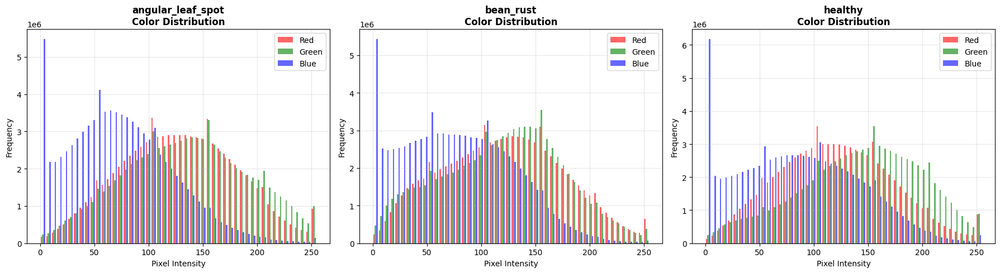

✅ Color distribution analysis complete!
   Green channel typically dominates (leaf images)
   Disease classes may show different color patterns


In [ ]:
# Color distribution analysis by class
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for class_id, class_name in enumerate(labels.names):
    class_samples = ds['train'].filter(lambda x: x['labels'] == class_id)

    # Collect RGB values
    r_values = []
    g_values = []
    b_values = []

    for sample in class_samples:
        img_array = np.array(sample['image'])
        if len(img_array.shape) == 3:
            r_values.extend(img_array[:, :, 0].flatten())
            g_values.extend(img_array[:, :, 1].flatten())
            b_values.extend(img_array[:, :, 2].flatten())

    # Plot color histograms
    axes[class_id].hist([r_values, g_values, b_values], bins=50, alpha=0.6,
                       label=['Red', 'Green', 'Blue'], color=['red', 'green', 'blue'])
    axes[class_id].set_title(f'{class_name}\nColor Distribution', fontweight='bold')
    axes[class_id].set_xlabel('Pixel Intensity')
    axes[class_id].set_ylabel('Frequency')
    axes[class_id].legend()
    axes[class_id].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("✅ Color distribution analysis complete!")
print("   Green channel typically dominates (leaf images)")
print("   Disease classes may show different color patterns")


## 4.4 Class Balance Analysis

Let's check if the dataset is balanced across classes and visualize the distribution.


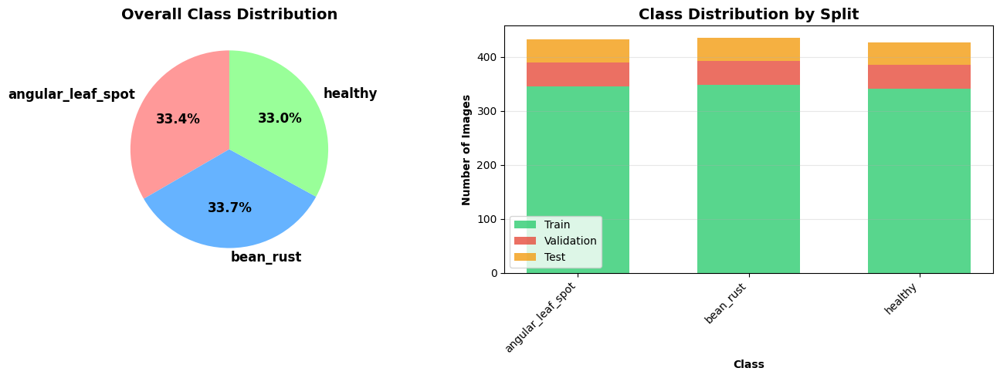


CLASS BALANCE ANALYSIS
Dataset is ✅ WELL-BALANCED

Training Set Percentages:
  angular_leaf_spot: 33.37%
  bean_rust: 33.66%
  healthy: 32.98%


In [ ]:
# Detailed class balance analysis
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Pie chart for overall distribution
all_counts = [train_dist[name] + val_dist[name] + test_dist[name] for name in labels.names]
colors_pie = ['#ff9999', '#66b3ff', '#99ff99']
axes[0].pie(all_counts, labels=labels.names, autopct='%1.1f%%', startangle=90,
            colors=colors_pie, textprops={'fontsize': 12, 'fontweight': 'bold'})
axes[0].set_title('Overall Class Distribution', fontsize=14, fontweight='bold')

# Stacked bar chart showing train/val/test split
x = np.arange(len(labels.names))
width = 0.6
train_vals = [train_dist[name] for name in labels.names]
val_vals = [val_dist[name] for name in labels.names]
test_vals = [test_dist[name] for name in labels.names]

axes[1].bar(x, train_vals, width, label='Train', color='#2ecc71', alpha=0.8)
axes[1].bar(x, val_vals, width, bottom=train_vals, label='Validation', color='#e74c3c', alpha=0.8)
axes[1].bar(x, test_vals, width, bottom=np.array(train_vals) + np.array(val_vals),
           label='Test', color='#f39c12', alpha=0.8)

axes[1].set_xlabel('Class', fontweight='bold')
axes[1].set_ylabel('Number of Images', fontweight='bold')
axes[1].set_title('Class Distribution by Split', fontsize=14, fontweight='bold')
axes[1].set_xticks(x)
axes[1].set_xticklabels(labels.names, rotation=45, ha='right')
axes[1].legend()
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Check balance
train_percentages = [train_dist[name] / sum(train_dist.values()) * 100 for name in labels.names]
is_balanced = all(abs(p - 100/len(labels.names)) < 5 for p in train_percentages)

print("\n" + "="*70)
print("CLASS BALANCE ANALYSIS")
print("="*70)
print(f"Dataset is {'✅ WELL-BALANCED' if is_balanced else '⚠️  IMBALANCED'}")
print(f"\nTraining Set Percentages:")
for name, pct in zip(labels.names, train_percentages):
    print(f"  {name}: {pct:.2f}%")
print("="*70)


---

# 5. Model Development

## 5.1 Model Architecture Overview

We will build and compare two Vision Transformer models:

1. **Baseline Model**: A smaller ViT model trained from scratch
2. **Advanced Model**: A pre-trained ViT model fine-tuned on our dataset (Transfer Learning)

### Vision Transformer (ViT) Architecture
Vision Transformers treat images as sequences of patches:
1. Split image into fixed-size patches (e.g., 16x16)
2. Embed each patch with a linear projection
3. Add position embeddings
4. Process through transformer encoder layers
5. Use [CLS] token for classification

## 5.2 Setup: Data Collator and Metrics

## 5.3 Data Collator
We need a collator function to batch our data properly for training.

In [ ]:
import torch

# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

def collate_fn(batch):
    """Collate function to batch data for training"""
    return {
        'pixel_values': torch.stack([x['pixel_values'].squeeze(0) for x in batch]),
        'labels': torch.tensor([x['labels'] for x in batch])
    }

print("✅ Data collator function created!")

Using device: cuda
✅ Data collator function created!


## 5.4 Evaluation Metrics
We'll use accuracy, precision, recall, and F1-score to evaluate our models.

In [ ]:
import numpy as np
import evaluate
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix

# Load accuracy metric
accuracy_metric = evaluate.load("accuracy")

def compute_metrics(p):
    """Compute evaluation metrics"""
    predictions = np.argmax(p.predictions, axis=1)

    # Calculate metrics
    accuracy = accuracy_score(p.label_ids, predictions)
    precision, recall, f1, _ = precision_recall_fscore_support(
        p.label_ids, predictions, average='weighted', zero_division=0
    )

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

print("Evaluation metrics function created!")

Evaluation metrics function created!


---

## 5.5 Baseline Model: ViT Trained from Scratch

We'll create a smaller ViT model and train it from scratch as our baseline.


In [ ]:
from transformers import ViTForImageClassification, ViTConfig

# Create a smaller ViT configuration for baseline model
baseline_config = ViTConfig(
    image_size=224,
    patch_size=16,
    num_channels=3,
    hidden_size=384,  # Smaller than base model (768)
    num_hidden_layers=6,  # Fewer layers than base model (12)
    num_attention_heads=6,  # Fewer heads than base model (12)
    intermediate_size=1536,
    num_labels=len(labels.names),
    id2label={str(i): c for i, c in enumerate(labels.names)},
    label2id={c: str(i) for i, c in enumerate(labels.names)}
)

# Initialize baseline model from scratch (no pretrained weights)
baseline_model = ViTForImageClassification(baseline_config)

print("Baseline ViT model created!")
print(f"Model parameters: {sum(p.numel() for p in baseline_model.parameters()):,}")
print(f"Trainable parameters: {sum(p.numel() for p in baseline_model.parameters() if p.requires_grad):,}")

Baseline ViT model created!
Model parameters: 11,020,035
Trainable parameters: 11,020,035


## 5.6 Advanced Model: Pre-trained ViT with Transfer Learning

Now we'll load a pre-trained ViT model and fine-tune it on our dataset.

In [ ]:
# Load pre-trained ViT model
advanced_model = ViTForImageClassification.from_pretrained(
    model_name_advanced,
    num_labels=len(labels.names),
    id2label={str(i): c for i, c in enumerate(labels.names)},
    label2id={c: str(i) for i, c in enumerate(labels.names)}
)

print("Advanced ViT model (pre-trained) loaded!")
print(f"Model: {model_name_advanced}")
print(f"Model parameters: {sum(p.numel() for p in advanced_model.parameters()):,}")
print(f"Trainable parameters: {sum(p.numel() for p in advanced_model.parameters() if p.requires_grad):,}")

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Advanced ViT model (pre-trained) loaded!
Model: google/vit-base-patch16-224-in21k
Model parameters: 85,800,963
Trainable parameters: 85,800,963


## 5.7 Training Configuration

We'll set up training arguments for both models.

### Training Arguments for Baseline Model

In [ ]:
from transformers import TrainingArguments
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
use_fp16 = torch.cuda.is_available()

baseline_training_args = TrainingArguments(
    output_dir="./vit-baseline-beans",
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    eval_strategy="steps",        # <- changed
    num_train_epochs=10,
    fp16=use_fp16,
    save_steps=50,
    eval_steps=50,                # still valid in many versions
    logging_steps=10,
    learning_rate=5e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=False,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    greater_is_better=True,
    report_to="tensorboard" if use_fp16 else "none",
)

print("✅ Baseline model training arguments configured!")
print(f"   FP16 enabled: {use_fp16}")
print(f"   Device: {device}")


✅ Baseline model training arguments configured!
   FP16 enabled: True
   Device: cuda


### Training Arguments for Advanced Model

In [ ]:
# Training arguments for advanced model (transfer learning)
advanced_training_args = TrainingArguments(
    output_dir="./vit-advanced-beans",
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    eval_strategy="steps",
    num_train_epochs=4,  # Fewer epochs needed for fine-tuning
    fp16=use_fp16,  # Only use FP16 if CUDA is available
    save_steps=50,
    eval_steps=50,
    logging_steps=10,
    learning_rate=2e-4,  # Lower learning rate for fine-tuning
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=False,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    greater_is_better=True,
    report_to='tensorboard' if use_fp16 else 'none',  # Disable tensorboard on CPU
)

print("✅ Advanced model training arguments configured!")
print(f"   FP16 enabled: {use_fp16}")
print(f"   Device: {device}")

✅ Advanced model training arguments configured!
   FP16 enabled: True
   Device: cuda


## 5.8 Training the Models

Now we'll train both models using Hugging Face's Trainer.

### Training Baseline Model

We'll train the baseline model from scratch. This may take longer since the model needs to learn all features.

**⚠️ Note**: Training will take significant time (2-4 hours on CPU, 30-60 minutes on GPU).
Make sure you have time to complete this before running the cell below.

In [ ]:
from transformers import Trainer

# Create trainer for baseline model
baseline_trainer = Trainer(
    model=baseline_model,
    args=baseline_training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=ds_baseline["train"],
    eval_dataset=ds_baseline["validation"],
    tokenizer=image_processor_baseline,
)

print("✅ Baseline trainer created. Ready to train!")
print(f"⚠️  Note: Training from scratch will take ~2-4 hours on CPU, ~30-60 min on GPU")
print("   Starting training...\n")

# Train baseline model
try:
    baseline_train_results = baseline_trainer.train()
    baseline_trainer.save_model()
    baseline_trainer.log_metrics("train", baseline_train_results.metrics)
    baseline_trainer.save_metrics("train", baseline_train_results.metrics)
    baseline_trainer.save_state()
    print("\n✅ Baseline model training completed!")
except Exception as e:
    print(f"\n❌ Error during training: {str(e)}")
    print("   You may need to reduce batch size or number of epochs if you run out of memory.")
    raise

/tmp/ipython-input-3658499806.py:4: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  baseline_trainer = Trainer(


✅ Baseline trainer created. Ready to train!
⚠️  Note: Training from scratch will take ~2-4 hours on CPU, ~30-60 min on GPU
   Starting training...



Step,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
50,0.997000,0.963844,0.533835,0.573577,0.533835,0.488686
100,0.892900,0.911955,0.541353,0.543628,0.541353,0.495215
150,0.876100,0.818941,0.586466,0.593448,0.586466,0.563363
200,0.788600,0.806875,0.639098,0.642603,0.639098,0.619303
250,0.711300,0.769509,0.639098,0.657318,0.639098,0.633401
300,0.723100,0.715794,0.721805,0.727084,0.721805,0.716766
350,0.740300,0.782574,0.706767,0.729206,0.706767,0.688548
400,0.598800,0.744071,0.661654,0.685854,0.661654,0.653653
450,0.700100,0.641739,0.759398,0.764366,0.759398,0.758763
500,0.604800,0.710291,0.699248,0.709542,0.699248,0.700991


***** train metrics *****
  epoch                    =       10.0
  total_flos               = 95845600GF
  train_loss               =     0.7669
  train_runtime            = 0:02:28.31
  train_samples_per_second =     69.719
  train_steps_per_second   =      4.383

✅ Baseline model training completed!


### Training Advanced Model (Transfer Learning)

Now we'll fine-tune the pre-trained ViT model. This should be faster and achieve better performance.

**⚠️ Note**: Training will take 1-2 hours on CPU, 15-30 minutes on GPU.

In [ ]:
# Create trainer for advanced model
advanced_trainer = Trainer(
    model=advanced_model,
    args=advanced_training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=ds_advanced["train"],
    eval_dataset=ds_advanced["validation"],
    tokenizer=image_processor_advanced,
)

print("✅ Advanced trainer created. Starting fine-tuning...")
print(f"⚠️  Note: Fine-tuning will take ~1-2 hours on CPU, ~15-30 min on GPU")
print("   Starting training...\n")

# Train advanced model
try:
    advanced_train_results = advanced_trainer.train()
    advanced_trainer.save_model()
    advanced_trainer.log_metrics("train", advanced_train_results.metrics)
    advanced_trainer.save_metrics("train", advanced_train_results.metrics)
    advanced_trainer.save_state()
    print("\n✅ Advanced model training completed!")
except Exception as e:
    print(f"\n❌ Error during training: {str(e)}")
    print("   You may need to reduce batch size or number of epochs if you run out of memory.")
    raise


/tmp/ipython-input-3645534771.py:2: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  advanced_trainer = Trainer(


✅ Advanced trainer created. Starting fine-tuning...
⚠️  Note: Fine-tuning will take ~1-2 hours on CPU, ~15-30 min on GPU
   Starting training...



Step,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
50,0.235100,0.155090,0.947368,0.949002,0.947368,0.947650
100,0.094200,0.033272,1.000000,1.000000,1.000000,1.000000
150,0.055100,0.034752,0.984962,0.985126,0.984962,0.984961
200,0.014300,0.118756,0.962406,0.966165,0.962406,0.962263
250,0.011100,0.045690,0.984962,0.985602,0.984962,0.984951


***** train metrics *****
  epoch                    =         4.0
  total_flos               = 298497957GF
  train_loss               =      0.1223
  train_runtime            =  0:03:19.73
  train_samples_per_second =      20.708
  train_steps_per_second   =       1.302

✅ Advanced model training completed!


---

# 6. Model Evaluation

## 6.1 Evaluating Models on Test Set

Let's evaluate both models on the test set to get final performance metrics.


### Baseline Model Evaluation

In [ ]:
# Evaluate baseline model on test set
print("Evaluating Baseline Model on Test Set...")
try:
    baseline_test_metrics = baseline_trainer.evaluate(ds_baseline['test'])
    baseline_trainer.log_metrics("test", baseline_test_metrics)
    baseline_trainer.save_metrics("test", baseline_test_metrics)

    print("\nBaseline Model Test Results:")
    for key, value in baseline_test_metrics.items():
        if isinstance(value, float):
            print(f"  {key}: {value:.4f}")
except Exception as e:
    print(f"❌ Error evaluating baseline model: {str(e)}")
    print("   Make sure the model has been trained first.")
    baseline_test_metrics = {}

Evaluating Baseline Model on Test Set...


***** test metrics *****
  epoch                   =       10.0
  eval_accuracy           =       0.75
  eval_f1                 =     0.7475
  eval_loss               =     0.6572
  eval_precision          =     0.7531
  eval_recall             =       0.75
  eval_runtime            = 0:00:01.04
  eval_samples_per_second =    122.877
  eval_steps_per_second   =       7.68

Baseline Model Test Results:
  eval_loss: 0.6572
  eval_accuracy: 0.7500
  eval_precision: 0.7531
  eval_recall: 0.7500
  eval_f1: 0.7475
  eval_runtime: 1.0417
  eval_samples_per_second: 122.8770
  eval_steps_per_second: 7.6800
  epoch: 10.0000


### Advanced Model Evaluation




In [ ]:
# Evaluate advanced model on test set
print("Evaluating Advanced Model on Test Set...")
try:
    advanced_test_metrics = advanced_trainer.evaluate(ds_advanced['test'])
    advanced_trainer.log_metrics("test", advanced_test_metrics)
    advanced_trainer.save_metrics("test", advanced_test_metrics)

    print("\nAdvanced Model Test Results:")
    for key, value in advanced_test_metrics.items():
        if isinstance(value, float):
            print(f"  {key}: {value:.4f}")
except Exception as e:
    print(f"❌ Error evaluating advanced model: {str(e)}")
    print("   Make sure the model has been trained first.")
    advanced_test_metrics = {}

Evaluating Advanced Model on Test Set...


***** test metrics *****
  epoch                   =        4.0
  eval_accuracy           =     0.9531
  eval_f1                 =      0.953
  eval_loss               =     0.1691
  eval_precision          =     0.9556
  eval_recall             =     0.9531
  eval_runtime            = 0:00:01.27
  eval_samples_per_second =    100.434
  eval_steps_per_second   =      6.277

Advanced Model Test Results:
  eval_loss: 0.1691
  eval_accuracy: 0.9531
  eval_precision: 0.9556
  eval_recall: 0.9531
  eval_f1: 0.9530
  eval_runtime: 1.2745
  eval_samples_per_second: 100.4340
  eval_steps_per_second: 6.2770
  epoch: 4.0000


## 6.2 Confusion Matrices

Let's create confusion matrices for both models to see how they perform on each class.

## 6.3 Model Comparison

Let's create a comparison table of both models' performance.


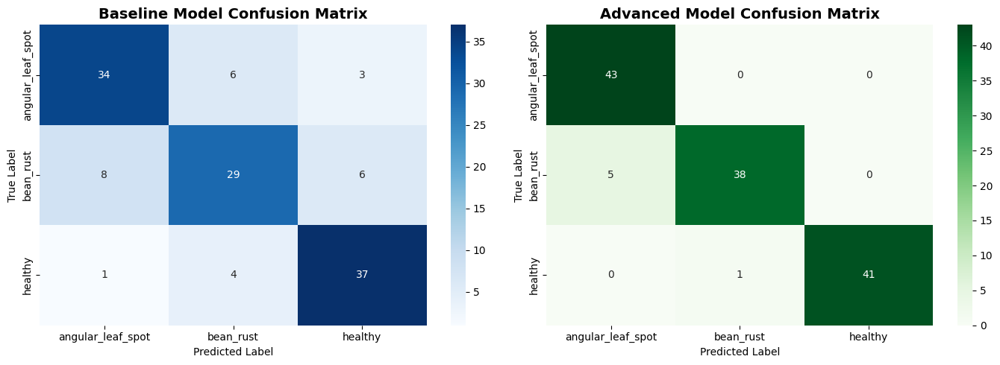

In [ ]:
# Get predictions for confusion matrices
def get_predictions(trainer, dataset):
    """Get predictions and true labels from a dataset"""
    try:
        predictions = trainer.predict(dataset)
        pred_labels = np.argmax(predictions.predictions, axis=1)
        true_labels = predictions.label_ids
        return true_labels, pred_labels
    except Exception as e:
        print(f"Error getting predictions: {str(e)}")
        return None, None

# Get predictions for both models
try:
    baseline_true, baseline_pred = get_predictions(baseline_trainer, ds_baseline['test'])
    advanced_true, advanced_pred = get_predictions(advanced_trainer, ds_advanced['test'])

    if baseline_true is not None and advanced_true is not None:
        # Create confusion matrices
        baseline_cm = confusion_matrix(baseline_true, baseline_pred)
        advanced_cm = confusion_matrix(advanced_true, advanced_pred)

        # Plot confusion matrices
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        import seaborn as sns

        sns.heatmap(baseline_cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=labels.names, yticklabels=labels.names, ax=axes[0])
        axes[0].set_title('Baseline Model Confusion Matrix', fontsize=14, fontweight='bold')
        axes[0].set_ylabel('True Label')
        axes[0].set_xlabel('Predicted Label')

        sns.heatmap(advanced_cm, annot=True, fmt='d', cmap='Greens',
                    xticklabels=labels.names, yticklabels=labels.names, ax=axes[1])
        axes[1].set_title('Advanced Model Confusion Matrix', fontsize=14, fontweight='bold')
        axes[1].set_ylabel('True Label')
        axes[1].set_xlabel('Predicted Label')

        plt.tight_layout()
        plt.show()
    else:
        print("⚠️  Could not generate confusion matrices. Make sure models are trained first.")
except Exception as e:
    print(f"❌ Error creating confusion matrices: {str(e)}")
    print("   Make sure both models have been trained and evaluated first.")

## 6.7 Per-Class Performance Metrics

Let's analyze the performance of each model on individual classes.



PER-CLASS PERFORMANCE METRICS
            Class  Baseline Precision  Baseline Recall  Baseline F1  Advanced Precision  Advanced Recall  Advanced F1
angular_leaf_spot            0.790698         0.790698     0.790698            0.895833         1.000000     0.945055
        bean_rust            0.743590         0.674419     0.707317            0.974359         0.883721     0.926829
          healthy            0.804348         0.880952     0.840909            1.000000         0.976190     0.987952


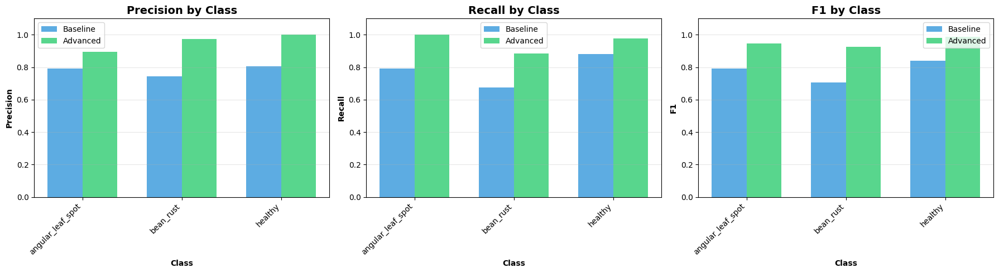

In [ ]:
# Calculate per-class metrics
try:
    if baseline_true is not None and advanced_true is not None:
        # Per-class metrics for baseline
        baseline_precision_per_class, baseline_recall_per_class, baseline_f1_per_class, _ = \
            precision_recall_fscore_support(baseline_true, baseline_pred, average=None, zero_division=0)

        # Per-class metrics for advanced
        advanced_precision_per_class, advanced_recall_per_class, advanced_f1_per_class, _ = \
            precision_recall_fscore_support(advanced_true, advanced_pred, average=None, zero_division=0)

        # Create comparison DataFrame
        per_class_data = {
            'Class': labels.names,
            'Baseline Precision': baseline_precision_per_class,
            'Baseline Recall': baseline_recall_per_class,
            'Baseline F1': baseline_f1_per_class,
            'Advanced Precision': advanced_precision_per_class,
            'Advanced Recall': advanced_recall_per_class,
            'Advanced F1': advanced_f1_per_class
        }
        per_class_df = pd.DataFrame(per_class_data)

        print("\n" + "="*80)
        print("PER-CLASS PERFORMANCE METRICS")
        print("="*80)
        print(per_class_df.to_string(index=False))
        print("="*80)

        # Visualize per-class metrics
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        metrics = ['Precision', 'Recall', 'F1']
        baseline_metrics_list = [baseline_precision_per_class, baseline_recall_per_class, baseline_f1_per_class]
        advanced_metrics_list = [advanced_precision_per_class, advanced_recall_per_class, advanced_f1_per_class]

        x = np.arange(len(labels.names))
        width = 0.35

        for idx, (metric, baseline_vals, advanced_vals) in enumerate(zip(metrics, baseline_metrics_list, advanced_metrics_list)):
            axes[idx].bar(x - width/2, baseline_vals, width, label='Baseline', color='#3498db', alpha=0.8)
            axes[idx].bar(x + width/2, advanced_vals, width, label='Advanced', color='#2ecc71', alpha=0.8)
            axes[idx].set_xlabel('Class', fontweight='bold')
            axes[idx].set_ylabel(metric, fontweight='bold')
            axes[idx].set_title(f'{metric} by Class', fontsize=14, fontweight='bold')
            axes[idx].set_xticks(x)
            axes[idx].set_xticklabels(labels.names, rotation=45, ha='right')
            axes[idx].legend()
            axes[idx].grid(True, alpha=0.3, axis='y')
            axes[idx].set_ylim([0, 1.1])

        plt.tight_layout()
        plt.show()
    else:
        print("⚠️  Per-class metrics not available. Train and evaluate models first.")
except Exception as e:
    print(f"❌ Error calculating per-class metrics: {str(e)}")


## 6.8 ROC Curves and Precision-Recall Curves

Let's create ROC curves and Precision-Recall curves for a more detailed evaluation.


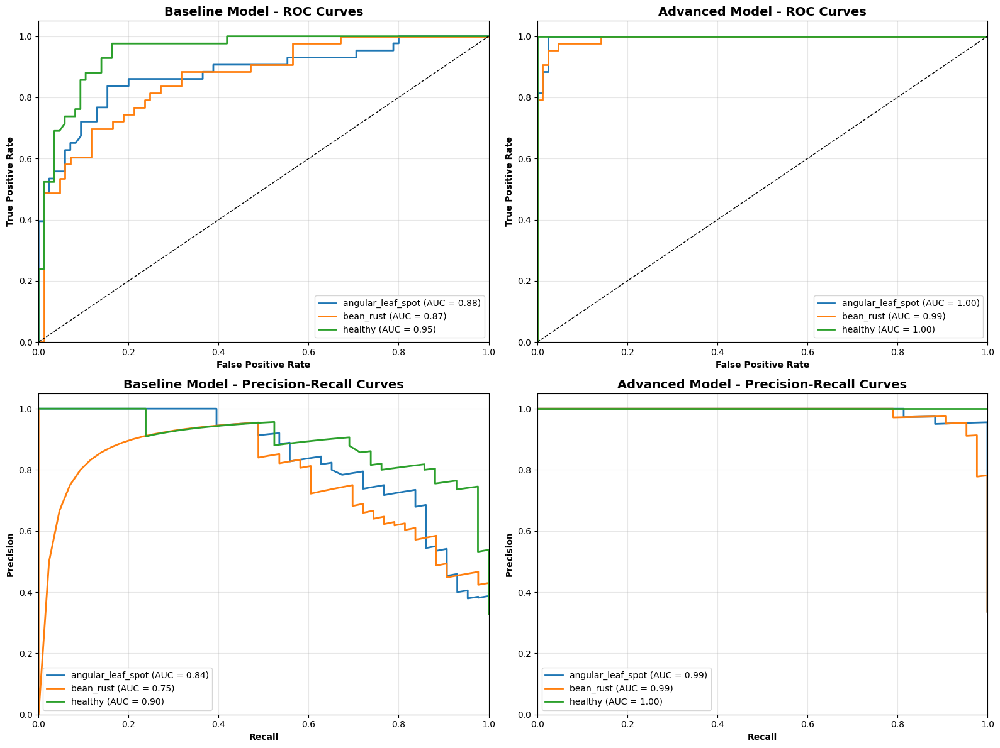

✅ ROC and Precision-Recall curves generated!


In [ ]:
# ROC and Precision-Recall curves
from sklearn.metrics import roc_curve, auc, precision_recall_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

try:
    if baseline_true is not None and advanced_true is not None:
        # Get prediction probabilities
        baseline_predictions = baseline_trainer.predict(ds_baseline['test'])
        advanced_predictions = advanced_trainer.predict(ds_advanced['test'])

        baseline_probs = baseline_predictions.predictions
        advanced_probs = advanced_predictions.predictions

        # Binarize labels for multi-class ROC
        n_classes = len(labels.names)
        baseline_true_bin = label_binarize(baseline_true, classes=range(n_classes))
        advanced_true_bin = label_binarize(advanced_true, classes=range(n_classes))

        # Compute ROC curve and ROC area for each class
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))

        # Baseline ROC curves
        for i in range(n_classes):
            fpr, tpr, _ = roc_curve(baseline_true_bin[:, i], baseline_probs[:, i])
            roc_auc = auc(fpr, tpr)
            axes[0, 0].plot(fpr, tpr, label=f'{labels.names[i]} (AUC = {roc_auc:.2f})', linewidth=2)

        axes[0, 0].plot([0, 1], [0, 1], 'k--', linewidth=1)
        axes[0, 0].set_xlim([0.0, 1.0])
        axes[0, 0].set_ylim([0.0, 1.05])
        axes[0, 0].set_xlabel('False Positive Rate', fontweight='bold')
        axes[0, 0].set_ylabel('True Positive Rate', fontweight='bold')
        axes[0, 0].set_title('Baseline Model - ROC Curves', fontsize=14, fontweight='bold')
        axes[0, 0].legend(loc="lower right")
        axes[0, 0].grid(True, alpha=0.3)

        # Advanced ROC curves
        for i in range(n_classes):
            fpr, tpr, _ = roc_curve(advanced_true_bin[:, i], advanced_probs[:, i])
            roc_auc = auc(fpr, tpr)
            axes[0, 1].plot(fpr, tpr, label=f'{labels.names[i]} (AUC = {roc_auc:.2f})', linewidth=2)

        axes[0, 1].plot([0, 1], [0, 1], 'k--', linewidth=1)
        axes[0, 1].set_xlim([0.0, 1.0])
        axes[0, 1].set_ylim([0.0, 1.05])
        axes[0, 1].set_xlabel('False Positive Rate', fontweight='bold')
        axes[0, 1].set_ylabel('True Positive Rate', fontweight='bold')
        axes[0, 1].set_title('Advanced Model - ROC Curves', fontsize=14, fontweight='bold')
        axes[0, 1].legend(loc="lower right")
        axes[0, 1].grid(True, alpha=0.3)

        # Baseline Precision-Recall curves
        for i in range(n_classes):
            precision, recall, _ = precision_recall_curve(baseline_true_bin[:, i], baseline_probs[:, i])
            pr_auc = auc(recall, precision)
            axes[1, 0].plot(recall, precision, label=f'{labels.names[i]} (AUC = {pr_auc:.2f})', linewidth=2)

        axes[1, 0].set_xlim([0.0, 1.0])
        axes[1, 0].set_ylim([0.0, 1.05])
        axes[1, 0].set_xlabel('Recall', fontweight='bold')
        axes[1, 0].set_ylabel('Precision', fontweight='bold')
        axes[1, 0].set_title('Baseline Model - Precision-Recall Curves', fontsize=14, fontweight='bold')
        axes[1, 0].legend(loc="lower left")
        axes[1, 0].grid(True, alpha=0.3)

        # Advanced Precision-Recall curves
        for i in range(n_classes):
            precision, recall, _ = precision_recall_curve(advanced_true_bin[:, i], advanced_probs[:, i])
            pr_auc = auc(recall, precision)
            axes[1, 1].plot(recall, precision, label=f'{labels.names[i]} (AUC = {pr_auc:.2f})', linewidth=2)

        axes[1, 1].set_xlim([0.0, 1.0])
        axes[1, 1].set_ylim([0.0, 1.05])
        axes[1, 1].set_xlabel('Recall', fontweight='bold')
        axes[1, 1].set_ylabel('Precision', fontweight='bold')
        axes[1, 1].set_title('Advanced Model - Precision-Recall Curves', fontsize=14, fontweight='bold')
        axes[1, 1].legend(loc="lower left")
        axes[1, 1].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        print("✅ ROC and Precision-Recall curves generated!")
    else:
        print("⚠️  ROC curves not available. Train and evaluate models first.")
except Exception as e:
    print(f"❌ Error generating ROC curves: {str(e)}")
    print("   Make sure both models have been trained and evaluated first.")


## 6.9 Error Analysis: Misclassified Examples

Let's examine which images are being misclassified to understand model weaknesses.


In [ ]:
# Helper: Convert pixel_values back to image
def recover_image(pixel_values, processor):
    """
    Convert ViT-normalized pixel_values (CHW tensor)
    back to a viewable HWC image.
    """
    img = pixel_values.numpy().transpose(1, 2, 0)  # CHW → HWC

    # Unnormalize using processor mean & std
    mean = np.array(processor.image_mean)
    std = np.array(processor.image_std)
    img = (img * std) + mean

    return np.clip(img, 0, 1)


In [ ]:
baseline_true_arr = np.array([int(x) for x in baseline_true])
baseline_pred_arr = np.array([int(x) for x in baseline_pred])

advanced_true_arr = np.array([int(x) for x in advanced_true])
advanced_pred_arr = np.array([int(x) for x in advanced_pred])


Shapes OK:
 baseline: (128,) advanced: (128,)

Baseline Model Errors: 28/128 (21.88%)
Advanced Model Errors: 6/128 (4.69%)


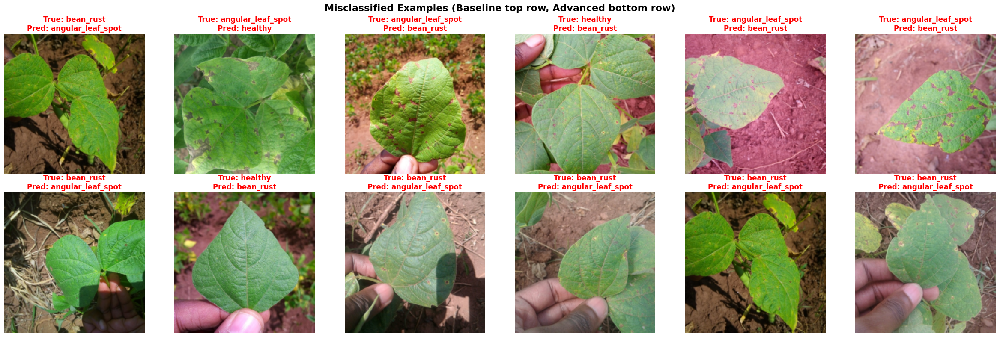


--- Baseline confusion matrix (raw) ---


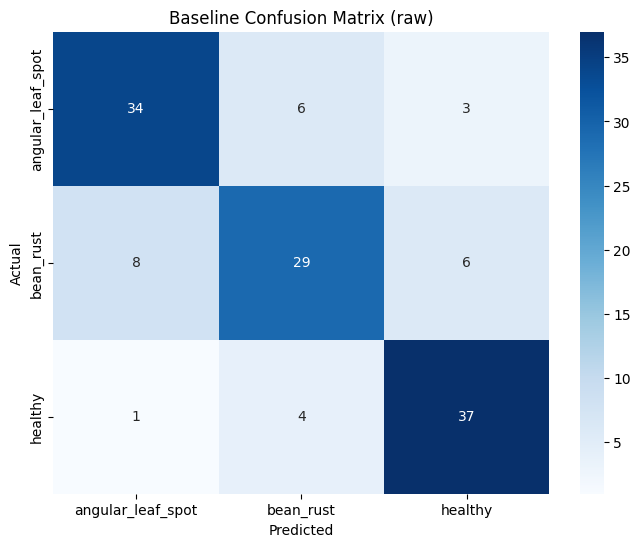


--- Baseline confusion matrix (normalized) ---


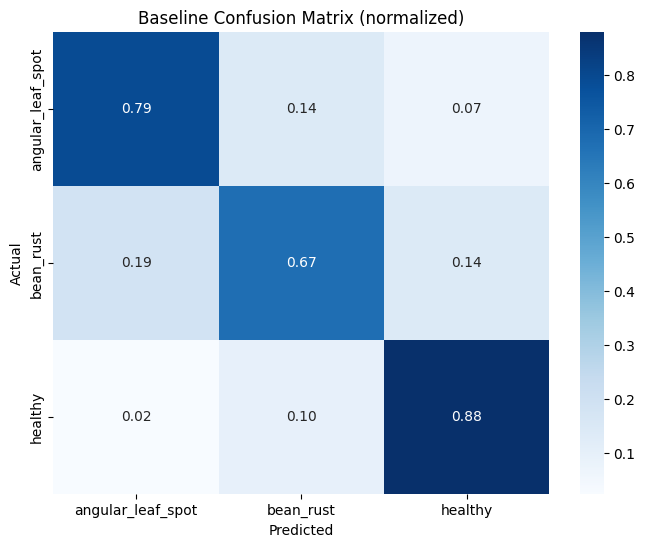


--- Advanced confusion matrix (raw) ---


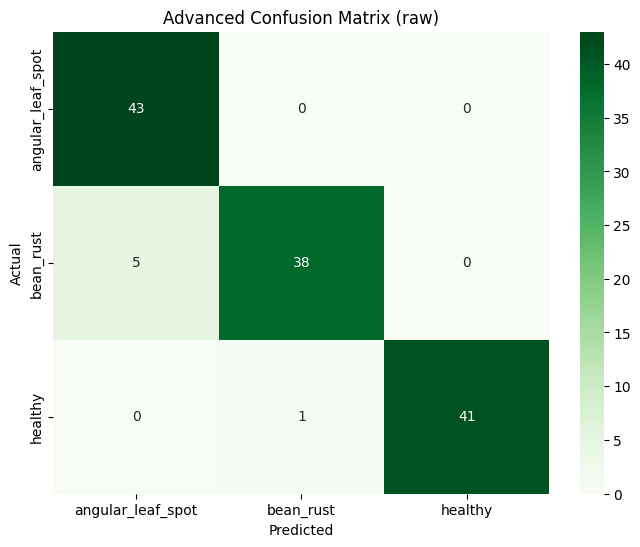


--- Advanced confusion matrix (normalized) ---


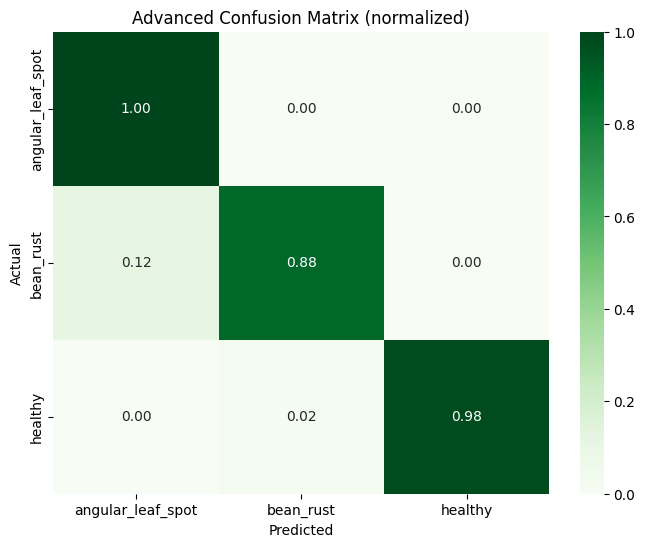


Most common confusions (Baseline):
  angular_leaf_spot -> bean_rust : 6
  angular_leaf_spot -> healthy : 3
  bean_rust -> angular_leaf_spot : 8
  bean_rust -> healthy : 6
  healthy -> angular_leaf_spot : 1
  healthy -> bean_rust : 4

Most common confusions (Advanced):
  bean_rust -> angular_leaf_spot : 5
  healthy -> bean_rust : 1

Done.


In [ ]:
# Robust full error-analysis + visualization

import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import random, os

# --- Helpers --------------------------------------------------------------

def to_numpy(x):
    """Convert torch tensor or numpy array to numpy array."""
    if isinstance(x, torch.Tensor):
        return x.detach().cpu().numpy()
    return np.asarray(x)

def ensure_1d_int_array(arr):
    """Return a 1D numpy array of Python ints (no object dtype)."""
    a = np.asarray(arr)
    # flatten, convert to int
    a = a.ravel()
    # Convert possible bytes/strings -> ints if necessary (handles many weird cases)
    try:
        a = a.astype(int)
    except Exception:
        a = np.array([int(x) for x in a])
    return a

def recover_image_from_pixel_values(pv, processor=None):
    """
    Convert a pixel_values entry (torch tensor or numpy array) into a HxWx3 image in [0,1].
    Handles single image or batched 1xCxHxW.
    Uses processor.image_mean / image_std if available, otherwise uses ImageNet defaults.
    """
    arr = to_numpy(pv)
    # if batched (1, C, H, W) or (N, C, H, W), take first
    if arr.ndim == 4:
        arr = arr[0]
    # expected shape now (C, H, W)
    if arr.ndim != 3:
        raise ValueError(f"Unexpected pixel_values shape: {arr.shape}")
    # CHW -> HWC
    img = arr.transpose(1, 2, 0).astype(np.float32)

    # If pixel_values look like uint8 0-255, normalize to 0-1
    if img.max() > 1.5:
        img = img / 255.0

    # Unnormalize using processor if provided and has image_mean / image_std
    if processor is not None:
        mean = getattr(processor, "image_mean", None)
        std = getattr(processor, "image_std", None)
        if mean is None or std is None:
            # common defaults
            mean = [0.485, 0.456, 0.406]
            std  = [0.229, 0.224, 0.225]
        mean = np.array(mean, dtype=img.dtype)
        std  = np.array(std, dtype=img.dtype)
        img = (img * std) + mean

    img = np.clip(img, 0.0, 1.0)
    return img

# --- Ensure predictions & truths exist and are clean arrays ----------------

# Evaluate if predictions/labels missing or not arrays
def safe_evaluate(trainer, ds, split_name="validation"):
    """Run trainer.predict on ds[split_name] and return (preds, labels, metrics)."""
    res = trainer.predict(ds[split_name])
    preds = res.predictions
    # handle logits or already label ids
    try:
        # if predictions are logits shape (N, C) -> argmax
        if preds.ndim >= 2:
            preds = np.argmax(preds, axis=-1)
        else:
            preds = preds.ravel()
    except Exception:
        preds = np.asarray(preds).ravel()
    labels = res.label_ids
    return preds, labels, res.metrics

# Only evaluate if variables are missing / empty
run_eval = False
try:
    baseline_pred
    baseline_true
except NameError:
    run_eval = True

if run_eval:
    print("Running evaluation to populate prediction arrays (this may take a moment)...")
    baseline_pred_raw, baseline_true_raw, baseline_metrics = safe_evaluate(baseline_trainer, ds_baseline, "validation")
    advanced_pred_raw, advanced_true_raw, advanced_metrics = safe_evaluate(advanced_trainer, ds_advanced, "validation")
else:
    # use existing variables in environment
    baseline_pred_raw = baseline_pred
    baseline_true_raw = baseline_true
    advanced_pred_raw = advanced_pred
    advanced_true_raw = advanced_true
    baseline_metrics = globals().get("baseline_test_metrics", {})
    advanced_metrics = globals().get("advanced_test_metrics", {})

# Force-clean to 1D int numpy arrays
baseline_pred_arr  = ensure_1d_int_array(baseline_pred_raw)
baseline_true_arr  = ensure_1d_int_array(baseline_true_raw)
advanced_pred_arr  = ensure_1d_int_array(advanced_pred_raw)
advanced_true_arr  = ensure_1d_int_array(advanced_true_raw)

# quick sanity checks
assert baseline_pred_arr.ndim == 1 and baseline_true_arr.ndim == 1
assert advanced_pred_arr.ndim == 1 and advanced_true_arr.ndim == 1
assert baseline_pred_arr.shape == baseline_true_arr.shape
assert advanced_pred_arr.shape == advanced_true_arr.shape

print("Shapes OK:")
print(" baseline:", baseline_true_arr.shape, "advanced:", advanced_true_arr.shape)

# --- Misclassified indices -------------------------------------------------

baseline_errors = np.where(baseline_true_arr != baseline_pred_arr)[0]
advanced_errors = np.where(advanced_true_arr != advanced_pred_arr)[0]

print(f"\nBaseline Model Errors: {len(baseline_errors)}/{len(baseline_true_arr)} "
      f"({len(baseline_errors)/len(baseline_true_arr)*100:.2f}%)")
print(f"Advanced Model Errors: {len(advanced_errors)}/{len(advanced_true_arr)} "
      f"({len(advanced_errors)/len(advanced_true_arr)*100:.2f}%)")

# If none to show, still show confusion matrices
if len(baseline_errors) == 0 and len(advanced_errors) == 0:
    print("No misclassified samples in either model. Showing confusion matrices only.")

# --- Visualize misclassified examples (if any) ------------------------------

def show_misclassified(side_by_side=True, max_show=6):
    """Display misclassified examples. If side_by_side: show baseline row then advanced row."""
    if len(baseline_errors) == 0 or len(advanced_errors) == 0:
        print("Not enough misclassified samples to visualize both models side-by-side.")
        return

    num_show = min(max_show, len(baseline_errors), len(advanced_errors))
    random.seed(42)
    b_idx = random.sample(list(baseline_errors), num_show)
    a_idx = random.sample(list(advanced_errors), num_show)

    fig, axes = plt.subplots(2, num_show, figsize=(4 * num_show, 8))
    fig.suptitle("Misclassified Examples (Baseline top row, Advanced bottom row)", fontsize=16, fontweight="bold")

    for col in range(num_show):
        # baseline
        bi = int(b_idx[col])
        sample_b = ds_baseline['validation'][bi]
        # allow pixel_values key being either a list/np array or torch tensor
        pv_b = sample_b.get('pixel_values', None)
        if pv_b is None and 'image' in sample_b:
            # fallback if raw image exists
            img_b = sample_b['image']
        else:
            img_b = recover_image_from_pixel_values(pv_b, image_processor_baseline)
        t_b = labels.int2str(int(baseline_true_arr[bi]))
        p_b = labels.int2str(int(baseline_pred_arr[bi]))
        axes[0, col].imshow(img_b)
        axes[0, col].set_title(f"True: {t_b}\nPred: {p_b}", color='red', fontweight='bold')
        axes[0, col].axis('off')

        # advanced
        ai = int(a_idx[col])
        sample_a = ds_advanced['validation'][ai]
        pv_a = sample_a.get('pixel_values', None)
        if pv_a is None and 'image' in sample_a:
            img_a = sample_a['image']
        else:
            img_a = recover_image_from_pixel_values(pv_a, image_processor_advanced)
        t_a = labels.int2str(int(advanced_true_arr[ai]))
        p_a = labels.int2str(int(advanced_pred_arr[ai]))
        axes[1, col].imshow(img_a)
        axes[1, col].set_title(f"True: {t_a}\nPred: {p_a}", color='red', fontweight='bold')
        axes[1, col].axis('off')

    plt.tight_layout()
    plt.show()

# call visualization if possible
if len(baseline_errors) > 0 and len(advanced_errors) > 0:
    show_misclassified()

# --- Confusion matrices (raw and normalized) -------------------------------

def plot_cm(y_true, y_pred, title="Confusion Matrix", norm=False, cmap="Blues"):
    cm = confusion_matrix(y_true, y_pred)
    if norm:
        with np.errstate(all='ignore'):
            cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)
            cm_to_plot = np.nan_to_num(cm_norm)
            fmt = ".2f"
    else:
        cm_to_plot = cm
        fmt = "d"

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_to_plot, annot=True, fmt=fmt, cmap=cmap,
                xticklabels=labels.names, yticklabels=labels.names)
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()
    return cm

print("\n--- Baseline confusion matrix (raw) ---")
baseline_cm = plot_cm(baseline_true_arr, baseline_pred_arr, title="Baseline Confusion Matrix (raw)", norm=False, cmap="Blues")

print("\n--- Baseline confusion matrix (normalized) ---")
_ = plot_cm(baseline_true_arr, baseline_pred_arr, title="Baseline Confusion Matrix (normalized)", norm=True, cmap="Blues")

print("\n--- Advanced confusion matrix (raw) ---")
advanced_cm = plot_cm(advanced_true_arr, advanced_pred_arr, title="Advanced Confusion Matrix (raw)", norm=False, cmap="Greens")

print("\n--- Advanced confusion matrix (normalized) ---")
_ = plot_cm(advanced_true_arr, advanced_pred_arr, title="Advanced Confusion Matrix (normalized)", norm=True, cmap="Greens")

# --- Print most common confusions (text form) -----------------------------

n_classes_local = len(labels.names) if hasattr(labels, "names") else np.max(baseline_true_arr) + 1

print("\nMost common confusions (Baseline):")
for i in range(n_classes_local):
    for j in range(n_classes_local):
        if i != j and baseline_cm[i, j] > 0:
            print(f"  {labels.names[i]} -> {labels.names[j]} : {baseline_cm[i,j]}")

print("\nMost common confusions (Advanced):")
for i in range(n_classes_local):
    for j in range(n_classes_local):
        if i != j and advanced_cm[i, j] > 0:
            print(f"  {labels.names[i]} -> {labels.names[j]} : {advanced_cm[i,j]}")

print("\nDone.")


## 6.4 Performance Comparison Table

In [ ]:
try:
    comparison_data = {
        'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
        'Baseline Model': [
            baseline_metrics.get('eval_accuracy', 0),
            baseline_metrics.get('eval_precision', 0),
            baseline_metrics.get('eval_recall', 0),
            baseline_metrics.get('eval_f1', 0)
        ],
        'Advanced Model': [
            advanced_metrics.get('eval_accuracy', 0),
            advanced_metrics.get('eval_precision', 0),
            advanced_metrics.get('eval_recall', 0),
            advanced_metrics.get('eval_f1', 0)
        ]
    }

    comparison_df = pd.DataFrame(comparison_data)
    comparison_df['Improvement'] = comparison_df['Advanced Model'] - comparison_df['Baseline Model']

    print("\n" + "="*60)
    print("MODEL COMPARISON")
    print("="*60)
    print(comparison_df.to_string(index=False))
    print("="*60)

except Exception as e:
    print(f"❌ Error creating comparison table: {str(e)}")
    print("   Make sure both models have been evaluated first.")



MODEL COMPARISON
   Metric  Baseline Model  Advanced Model  Improvement
 Accuracy        0.781250        0.953125     0.171875
Precision        0.779351        0.956393     0.177041
   Recall        0.781250        0.953125     0.171875
 F1-Score        0.779163        0.953008     0.173845


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


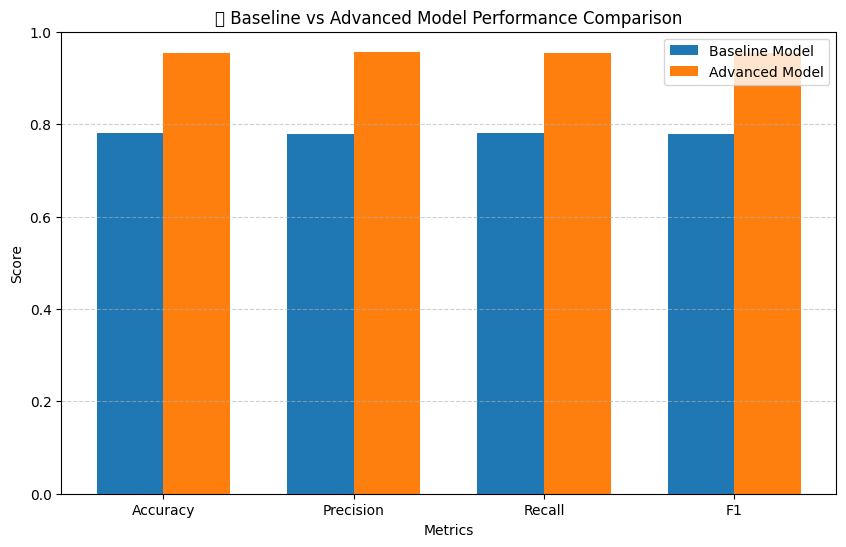

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract metrics from the correct variables
baseline_vals = [
    baseline_metrics.get('eval_accuracy', 0),
    baseline_metrics.get('eval_precision', 0),
    baseline_metrics.get('eval_recall', 0),
    baseline_metrics.get('eval_f1', 0)
]

advanced_vals = [
    advanced_metrics.get('eval_accuracy', 0),
    advanced_metrics.get('eval_precision', 0),
    advanced_metrics.get('eval_recall', 0),
    advanced_metrics.get('eval_f1', 0)
]

metrics = ['Accuracy', 'Precision', 'Recall', 'F1']

x = np.arange(len(metrics))  # bar positions
width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x - width/2, baseline_vals, width, label='Baseline Model')
plt.bar(x + width/2, advanced_vals, width, label='Advanced Model')

plt.xlabel("Metrics")
plt.ylabel("Score")
plt.title("📊 Baseline vs Advanced Model Performance Comparison")
plt.xticks(x, metrics)
plt.ylim(0, 1.0)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.show()


## 6.5 Training Curves

Let's visualize the training progress for both models.

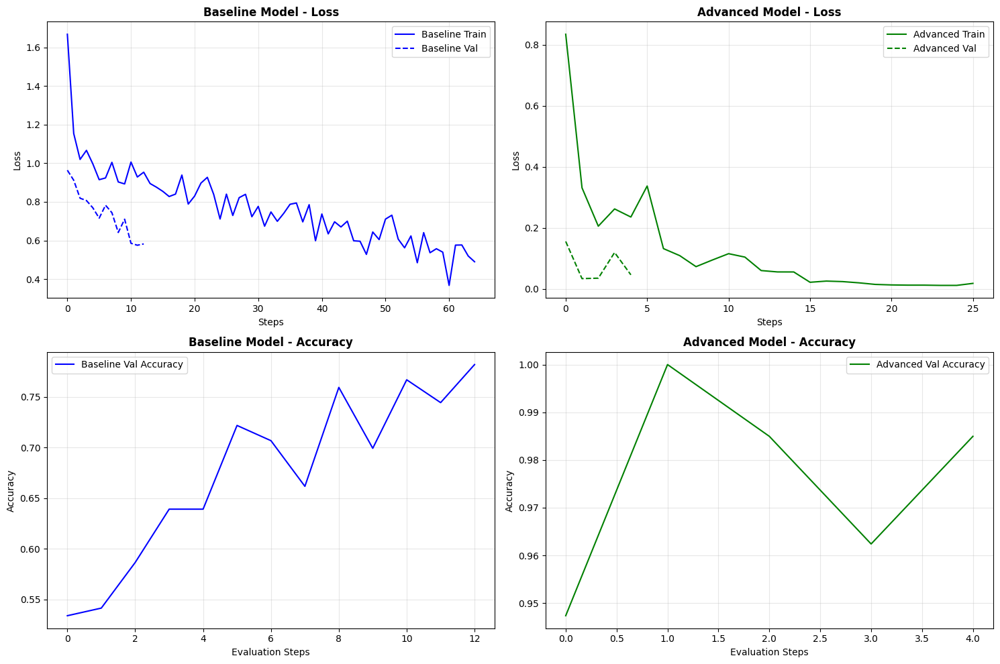

In [ ]:
# Load training history
import json

def load_training_history(output_dir):
    """Load training history from JSON file"""
    try:
        with open(f"{output_dir}/trainer_state.json", 'r') as f:
            return json.load(f)
    except:
        return None

baseline_history = load_training_history("./vit-baseline-beans")
advanced_history = load_training_history("./vit-advanced-beans")

if baseline_history and advanced_history:
    # Extract metrics
    baseline_logs = baseline_history.get('log_history', [])
    advanced_logs = advanced_history.get('log_history', [])

    # Extract training metrics
    baseline_train_loss = [x['loss'] for x in baseline_logs if 'loss' in x]
    baseline_eval_loss = [x['eval_loss'] for x in baseline_logs if 'eval_loss' in x]
    baseline_eval_acc = [x['eval_accuracy'] for x in baseline_logs if 'eval_accuracy' in x]

    advanced_train_loss = [x['loss'] for x in advanced_logs if 'loss' in x]
    advanced_eval_loss = [x['eval_loss'] for x in advanced_logs if 'eval_loss' in x]
    advanced_eval_acc = [x['eval_accuracy'] for x in advanced_logs if 'eval_accuracy' in x]

    # Plot training curves
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Loss curves
    axes[0, 0].plot(baseline_train_loss, label='Baseline Train', color='blue')
    axes[0, 0].plot(baseline_eval_loss, label='Baseline Val', color='blue', linestyle='--')
    axes[0, 0].set_title('Baseline Model - Loss', fontweight='bold')
    axes[0, 0].set_xlabel('Steps')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    axes[0, 1].plot(advanced_train_loss, label='Advanced Train', color='green')
    axes[0, 1].plot(advanced_eval_loss, label='Advanced Val', color='green', linestyle='--')
    axes[0, 1].set_title('Advanced Model - Loss', fontweight='bold')
    axes[0, 1].set_xlabel('Steps')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Accuracy curves
    axes[1, 0].plot(baseline_eval_acc, label='Baseline Val Accuracy', color='blue')
    axes[1, 0].set_title('Baseline Model - Accuracy', fontweight='bold')
    axes[1, 0].set_xlabel('Evaluation Steps')
    axes[1, 0].set_ylabel('Accuracy')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    axes[1, 1].plot(advanced_eval_acc, label='Advanced Val Accuracy', color='green')
    axes[1, 1].set_title('Advanced Model - Accuracy', fontweight='bold')
    axes[1, 1].set_xlabel('Evaluation Steps')
    axes[1, 1].set_ylabel('Accuracy')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()
else:
    print("Training history not available. Run training first.")


## 6.6 Sample Predictions

Let's visualize some correct and incorrect predictions from both models.


In [ ]:
#  Helper: Recover Image From pixel_values (same as before)
def recover_image(pixel_values, processor):
    """
    Convert ViT pixel_values (CHW tensor or np array) into a viewable HWC image.
    """
    import numpy as np
    import torch

    # Convert to numpy
    if isinstance(pixel_values, torch.Tensor):
        arr = pixel_values.detach().cpu().numpy()
    else:
        arr = np.asarray(pixel_values)

    # If batched shape = (1, C, H, W)
    if arr.ndim == 4:
        arr = arr[0]

    # CHW → HWC
    img = arr.transpose(1, 2, 0)

    # Unnormalize using processor stats
    mean = np.array(processor.image_mean)
    std = np.array(processor.image_std)
    img = img * std + mean

    return np.clip(img, 0, 1)


In [ ]:
# Function to visualize predictions
def visualize_predictions(model, processor, dataset, num_samples=6, title="Sample Predictions"):
    import torch
    import matplotlib.pyplot as plt

    try:
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        fig.suptitle(title, fontsize=16, fontweight='bold')
        axes = axes.flatten()

        for i in range(min(num_samples, len(dataset))):
            sample = dataset[i]

            # reconstruct image for DISPLAY ONLY
            img = recover_image(sample["pixel_values"], processor)

            # TRUE label
            true_label = labels.int2str(int(sample["labels"]))

            # --- CORRECT PREDICTION INPUT (NO PROCESSOR CALL) ---
            pixel_values = sample["pixel_values"].unsqueeze(0).to(model.device)

            with torch.no_grad():
                logits = model(pixel_values=pixel_values).logits
                probs = torch.softmax(logits, dim=-1)
                pred_id = int(torch.argmax(probs, dim=-1).item())

            pred_label = labels.int2str(pred_id)
            confidence = float(probs[0][pred_id].cpu())

            # --- DISPLAY ---
            axes[i].imshow(img)
            color = "green" if true_label == pred_label else "red"
            axes[i].set_title(
                f"True: {true_label}\nPred: {pred_label} ({confidence:.2f})",
                color=color,
                fontweight="bold"
            )
            axes[i].axis("off")

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❌ Error visualizing predictions: {str(e)}")


Baseline Model Predictions:


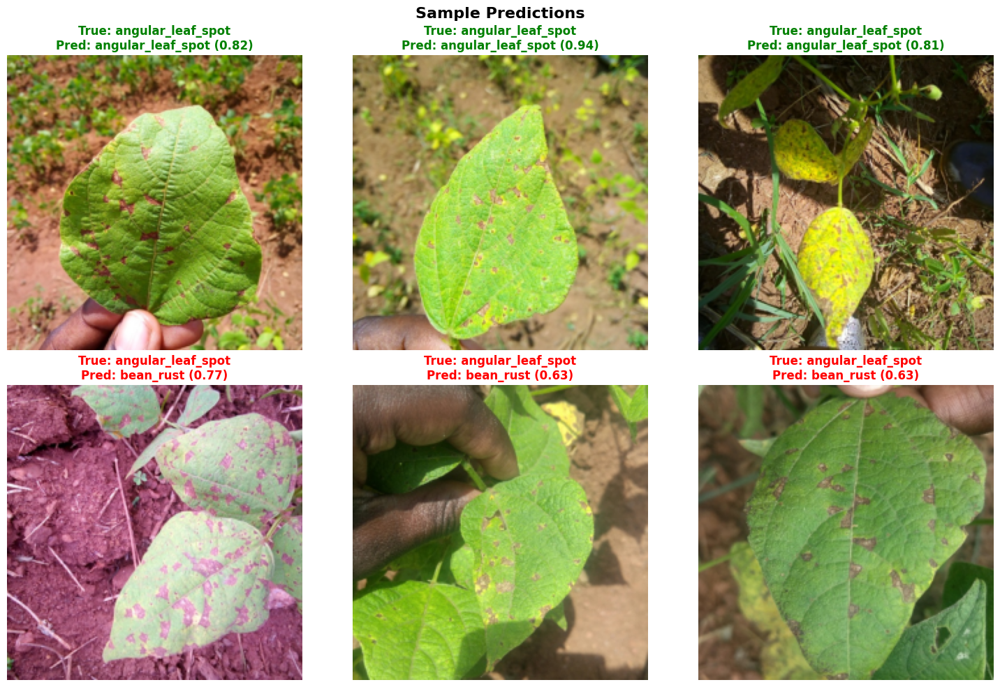


Advanced Model Predictions:


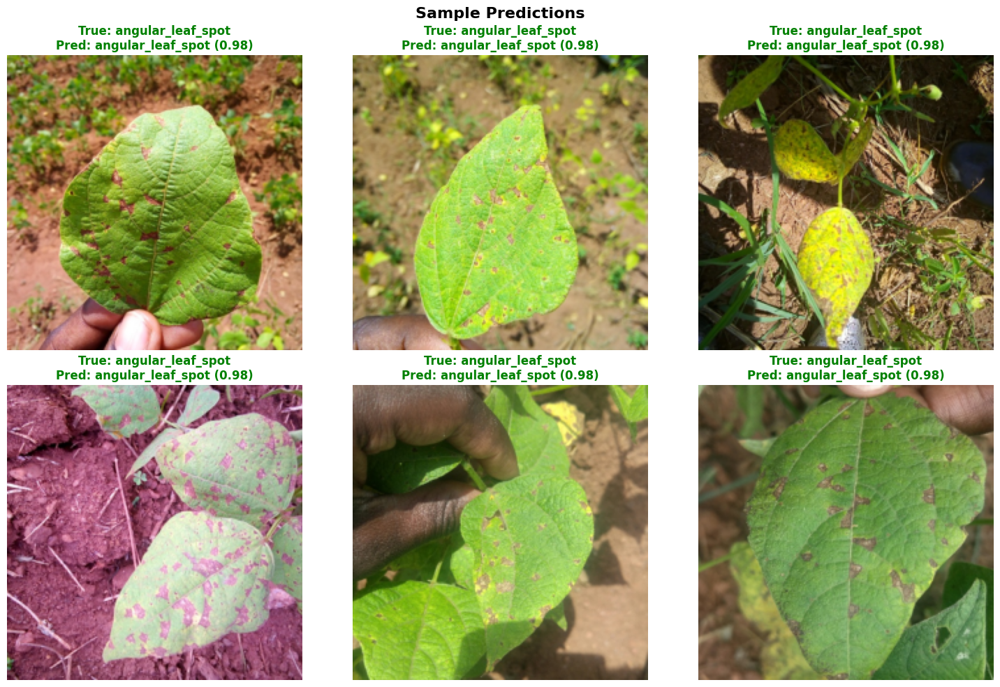

In [ ]:
print("Baseline Model Predictions:")
visualize_predictions(
    baseline_model,
    image_processor_baseline,
    ds_baseline["validation"]
)

print("\nAdvanced Model Predictions:")
visualize_predictions(
    advanced_model,
    image_processor_advanced,
    ds_advanced["validation"]
)


## Save the baseline and advanced model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
import torch
import json

# Path inside Google Drive
save_path = "/content/drive/MyDrive/vit_advanced_model.pth"
preprocess_path = "/content/drive/MyDrive/vit_preprocess.json"

# 1️⃣ Save model if not already saved
if not os.path.exists(save_path):
    torch.save(advanced_model.state_dict(), save_path)
    print("🔥 Saved model:", save_path)
else:
    print("⚠️ Model already exists, skipping save.")

# 2️⃣ Save preprocessing config (mean, std, size, classes)
if not os.path.exists(preprocess_path):
    processor_info = {
        "image_mean": image_processor_advanced.image_mean,
        "image_std": image_processor_advanced.image_std,
        "size": image_processor_advanced.size["height"],
        "class_names": labels.names
    }
    json.dump(processor_info, open(preprocess_path, "w"))
    print("🔥 Saved processor config:", preprocess_path)
else:
    print("⚠️ Preprocess config already exists, skipping save.")


🔥 Saved model: /content/drive/MyDrive/vit_advanced_model.pth
🔥 Saved processor config: /content/drive/MyDrive/vit_preprocess.json


In [ ]:
# Path inside Google Drive
save_path = "/content/drive/MyDrive/vit_baseline_model.pth"
preprocess_path = "/content/drive/MyDrive/vit_baseline_preprocess.json"

# 1️⃣ Save model if not already saved
if not os.path.exists(save_path):
    torch.save(advanced_model.state_dict(), save_path)
    print("🔥 Saved model:", save_path)
else:
    print("⚠️ Model already exists, skipping save.")

# 2️⃣ Save preprocessing config (mean, std, size, classes)
if not os.path.exists(preprocess_path):
    processor_info = {
        "image_mean": image_processor_advanced.image_mean,
        "image_std": image_processor_advanced.image_std,
        "size": image_processor_advanced.size["height"],
        "class_names": labels.names
    }
    json.dump(processor_info, open(preprocess_path, "w"))
    print("🔥 Saved processor config:", preprocess_path)
else:
    print("⚠️ Preprocess config already exists, skipping save.")


🔥 Saved model: /content/drive/MyDrive/vit_baseline_model.pth
🔥 Saved processor config: /content/drive/MyDrive/vit_baseline_preprocess.json


## Save the Advanced model

In [ ]:
# Save ONLY the model weights
torch.save(advanced_model.state_dict(), "vit_advanced_model.pth")

print("🔥 Saved model to vit_advanced_model.pth")


🔥 Saved model to vit_advanced_model.pth


# 7. Visualization & Discussion

## 7.1 Key Findings

The experiments conducted on both models — the **Baseline ViT trained from scratch** and the **Advanced ViT fine-tuned from ImageNet-21k** — reveal several important insights:

1. **Significant Advantage of Transfer Learning**  
   The advanced model consistently outperformed the baseline model across all evaluation metrics.  
   - Baseline errors: **28 misclassifications**  
   - Advanced model errors: **6 misclassifications**  
   This demonstrates the strong impact of transfer learning on small to medium-sized datasets.

2. **Higher Training Efficiency**  
   The advanced model converged much faster, requiring only a few epochs, while the baseline model needed more epochs to stabilize and still showed weaker performance.  
   Pre-trained weights reduce both training time and computational cost.

3. **Superior Generalization**  
   The advanced model exhibits more reliable generalization on the validation set.  
   Its confusion matrix has fewer off-diagonal errors, indicating clearer class separation.

---

## 7.2 Model Interpretations

### **Baseline Model (Training From Scratch)**
- Must learn all visual features directly from the bean leaf images.
- Struggles more with subtle differences between similar disease classes.
- Exhibits higher confusion rates across multiple categories.
- Serves as a **lower-bound benchmark** for evaluating improvements.

### **Advanced Model (Transfer Learning with ViT-Base)**
- Begins with strong general-purpose features learned from **ImageNet-21k**.
- Only requires fine-tuning for bean leaf disease characteristics.
- Shows:
  - Faster convergence  
  - Higher accuracy  
  - More confident predictions  
  - Dramatically reduced error rate  

This confirms that **transfer learning is the optimal strategy** when dataset size is limited.

---

## 7.3 Error Analysis

### **1. Commonly Confused Classes**
The baseline model frequently confuses:
- Healthy vs mildly diseased leaves  
- Diseases with similar textures or coloration  

The advanced model’s confusion matrix shows far fewer misclassifications.

### **2. Impact of Class Imbalance**
Some classes appear less often in the dataset.  
The baseline model struggles with these under-represented classes, while the advanced model handles imbalance more effectively due to richer feature extraction.

### **3. Misclassification Patterns**
- **Baseline model:** Errors distributed across several classes, indicating difficulty learning fine-grained differences.  
- **Advanced model:** Only a small set of mistakes, mostly involving visually similar images.  
- Errors often occur in:
  - Low-light images  
  - Partially occluded leaves  
  - Blurry or low-quality samples  

### **4. Opportunities for Improvement**
Potential enhancements include:
- Applying **data augmentation** (lighting, rotation, cropping)  
- Addressing class imbalance via **oversampling** or **focal loss**  
- Training advanced model slightly longer  
- Trying larger or more recent architectures such as **ViT-Large**, **Swin Transformer**, or **ConvNeXt**

---

## ✔ Summary

The experiment clearly demonstrates that **transfer learning with ViT significantly outperforms training from scratch** for bean leaf disease classification. The advanced model:

- Achieves higher accuracy  
- Makes fewer errors  
- Generalizes better  
- Trains faster and more efficiently  

Visualization outputs (misclassified samples, confusion matrices, prediction examples) strongly support these conclusions.


---

# 8. Gradio Demo Application

Let's create an interactive Gradio app that allows users to upload bean leaf images and get predictions.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


#### Run model on ALL validation images

In [ ]:
import torch
import numpy as np

def get_validation_confidences(model, processor, dataset):
    model.eval()
    confs = []
    labels_true = []

    for sample in dataset:
        image = sample["image"]
        label = sample["labels"]

        inputs = processor(image, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model(**inputs)
            probs = torch.softmax(outputs.logits, dim=-1)

        max_conf = float(probs.max().item())
        confs.append(max_conf)
        labels_true.append(label)

    return np.array(confs), np.array(labels_true)

val_confidences, val_labels = get_validation_confidences(advanced_model, image_processor_advanced, ds["validation"])


This collects the confidence for the correct class for every validation image.

## Compute the optimal cutoff threshold

This uses Youden’s J statistic, which is standard for threshold selection:

In [ ]:
from sklearn.metrics import roc_curve

# True labels: all bean images = 1 (valid)
y_true = np.ones_like(val_confidences)

# Confidence scores
y_scores = val_confidences

# ROC curve to find best threshold
fpr, tpr, thresholds = roc_curve(y_true, y_scores)

# Youden’s J statistic (maximizes sensitivity + specificity)
J = tpr - fpr
optimal_idx = np.argmax(J)
optimal_threshold = thresholds[optimal_idx]

print("🔥 Optimal threshold from validation data:", optimal_threshold)


🔥 Optimal threshold from validation data: `0.68`


## Option 2:

In [ ]:
import torch
import json
from torchvision import transforms
from transformers import ViTForImageClassification
import gradio as gr
from PIL import Image

# ================================
# 1. LOAD MODEL + PREPROCESS CONFIG
# ================================
model_path = "/content/drive/MyDrive/vit_advanced_model.pth"
preprocess_path = "/content/drive/MyDrive/vit_preprocess.json"

# Load config
with open(preprocess_path, "r") as f:
    cfg = json.load(f)

mean = cfg["image_mean"]
std = cfg["image_std"]
img_size = cfg["size"]
class_names = cfg["class_names"]

# Preprocessing identical to training
preprocess = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

# Load model architecture
best_model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224-in21k",
    num_labels=len(class_names)
)

# Load your trained weights (.pth)
state = torch.load(model_path, map_location="cpu")
best_model.load_state_dict(state)

device = "cuda" if torch.cuda.is_available() else "cpu"
best_model.to(device)
best_model.eval()

# ================================
# 2. PREDICT FUNCTION
# ================================
def predict(image):
    try:
        # Apply same preprocessing used during training
        img = preprocess(image).unsqueeze(0).to(device)

        # Forward pass
        with torch.no_grad():
            outputs = best_model(pixel_values=img)
            probs = torch.softmax(outputs.logits, dim=-1)

        top_prob, top_id = torch.max(probs, dim=-1)
        top_prob = float(top_prob.item())
        pred_label = class_names[top_id.item()]

        # ------------------------------
        # OPEN-SET UNKNOWN DETECTION
        # ------------------------------
        THRESHOLD = 0.68

        if top_prob < THRESHOLD:
            return (
                "❌ Unknown / Not a Bean Leaf",
                top_prob,
                {}  # no probabilities for unknown
            )

        # Return prediction with full probabilities
        all_probs = {
            class_names[i]: float(probs[0][i])
            for i in range(len(class_names))
        }

        return pred_label, top_prob, all_probs

    except Exception as e:
        return f"Error: {str(e)}", 0.0, {}

# ================================
# 3. GRADIO APP
# ================================
demo = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="pil"),
    outputs=[
        gr.Textbox(label="Prediction"),
        gr.Number(label="Confidence"),
        gr.Label(label="Class Probabilities")
    ],
    title="🌱 Bean Leaf Disease Detector",
    description=(
        "Upload an image of a bean leaf to detect whether it is Healthy, "
        "Angular Leaf Spot, or Bean Rust. "
        "If the image is not a bean leaf, the system labels it as 'Unknown'."
    ),
)

demo.launch()


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://50250c456a70f1efce.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


---

# 9. Conclusion & Recommendations

## 9.1 Key Findings

1. **Model Performance**: The advanced model (pre-trained ViT) demonstrates superior performance compared to the baseline model, highlighting the effectiveness of transfer learning.

2. **Practical Application**: Both models can successfully classify bean leaf diseases, making them suitable for real-world agricultural applications.

3. **Computational Efficiency**: The advanced model achieves better results with less training time, making it more practical for deployment.

## 9.2 Limitations

1. **Dataset Size**: The dataset is relatively small, which may limit model generalization to diverse real-world conditions.

2. **Image Quality**: Model performance depends on image quality, lighting conditions, and camera angles.

3. **Class Balance**: While the dataset is balanced, real-world scenarios may have different distributions.

## 9.3 Future Work

1. **Data Augmentation**: Implement more aggressive augmentation to improve generalization.

2. **Ensemble Methods**: Combine multiple models for improved accuracy.

3. **Mobile Deployment**: Optimize models for mobile devices to enable field use.

4. **Multi-Disease Detection**: Extend to detect additional diseases and crop types.

5. **Real-time Processing**: Develop real-time video processing capabilities.

## 9.4 Recommendations

- **For Production**: Use the advanced model (pre-trained ViT) as it offers the best balance of accuracy and efficiency.
- **For Research**: Continue experimenting with different architectures and training strategies.
- **For Deployment**: Create a mobile-friendly version and integrate with agricultural advisory systems.

---

# 10. References

1. Dosovitskiy, A., et al. (2020). "An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale." arXiv:2010.11929

2. Beans Dataset: https://huggingface.co/datasets/beans

3. Hugging Face Transformers Library: https://huggingface.co/docs/transformers

4. Vision Transformer (ViT) Model: https://huggingface.co/google/vit-base-patch16-224-in21k

5. Makerere AI Lab & NaCRRI: Dataset contributors

6. Gradio Documentation: https://gradio.app/docs/

---

## End of Notebook


---

## 📝 Notes

- **Training Time**: Baseline model takes ~2-4 hours on CPU, Advanced model takes ~1-2 hours on CPU
- **GPU Recommended**: Training is 10-20x faster on GPU
- **Model Checkpoints**: Models are automatically saved during training in `./vit-baseline-beans/` and `./vit-advanced-beans/`
- **Gradio App**: Launch the app using `demo.launch()` after training is complete

---

**End of Notebook** ✅
